## Model Training on Season Average Stats

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import json
import pandas as pd
pd.set_option('display.max_columns', None)

### Load Dataset

In [3]:
df = pd.read_csv('../data/preprocessed/stats_salaries_final.csv')
df

,PLAYER_ID,SEASON_START,TEAM_NAME_0,TEAM_NAME_1,TEAM_NAME_2,TEAM_NAME_3,TEAM_NAME_4,SALARY,INFLATION_ADJ_SALARY,TEAM_PAYROLL,INFLATION_ADJ_TEAM_PAYROLL,LEAGUE_PAYROLL,INFLATION_ADJ_LEAGUE_PAYROLL,TEAM_IMPORTANCE,LEAGUE_IMPORTANCE,TEAM_MARKET_SIZE,FGM,FGA,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TO,PF,PTS,PLUS_MINUS,WON_GAME,SECS_PLAYED,C,F,G,FG_PCT,FG3_PCT,FT_PCT
0,15,2004,0,0,0,0,1,2750000.0,3938661,57276129,82033174,1773666037,2540315861,0.048013,0.001550,0.032293,1.440000,3.840000,0.860000,2.440000,0.280000,0.320000,0.200000,1.280000,1.480000,0.520000,0.320000,0.100000,0.580000,0.860000,4.020000,-0.300000,0.440000,846.440000,0.0,0.000000,0.000000,0.375000,0.352459,0.875000
1,15,2005,0,0,0,0,1,3000000.0,4190683,57166530,79855609,1897469981,2650565322,0.052478,0.001581,0.030128,1.450000,3.460000,0.780000,1.940000,0.520000,0.650000,0.210000,1.030000,1.240000,0.670000,0.390000,0.030000,0.500000,0.850000,4.200000,0.300000,0.490000,703.610000,0.0,0.000000,0.110000,0.419075,0.402062,0.800000
2,15,2006,0,0,0,1,0,1178348.0,1577882,65841120,88165438,1939373647,2596944366,0.017897,0.000608,0.033950,1.270000,3.070000,0.640000,1.610000,0.450000,0.580000,0.190000,0.870000,1.060000,0.590000,0.330000,0.040000,0.450000,0.820000,3.630000,0.710000,0.550000,616.200000,0.0,0.000000,0.060000,0.413681,0.397516,0.775862
3,15,2007,0,0,0,1,0,1219590.0,1590374,71323049,93006958,2063887234,2691358145,0.017100,0.000591,0.034558,1.250000,3.020000,0.620000,1.620000,0.440000,0.570000,0.200000,0.850000,1.050000,0.550000,0.310000,0.050000,0.440000,0.800000,3.560000,0.570000,0.600000,585.960000,0.0,0.000000,0.060000,0.413907,0.382716,0.771930
4,56,2004,0,0,0,1,1,5408700.0,7746558,64577356,92490288,1773666037,2540315861,0.083755,0.003049,0.036409,5.230000,11.450000,0.650000,2.070000,1.900000,2.640000,0.870000,3.070000,3.940000,5.310000,1.130000,0.200000,1.730000,2.230000,13.010000,2.590000,0.650000,2078.580000,0.0,0.000000,1.000000,0.456769,0.314010,0.719697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6562,1630218,2021,0,0,1,0,1,1517981.0,1517981,130457848,130457848,4125163242,4125163242,0.011636,0.000368,0.031625,0.625000,1.625000,0.062500,0.500000,0.312500,0.625000,0.437500,1.125000,1.562500,0.125000,0.062500,0.250000,0.062500,0.375000,1.625000,0.125000,0.312500,271.562500,0.0,0.000000,0.000000,0.384615,0.125000,0.500000
6563,1630241,2021,1,0,1,0,1,1517981.0,1517981,117284457,117284457,4125163242,4125163242,0.012943,0.000368,0.028431,0.926829,2.146341,0.634146,1.439024,0.121951,0.121951,0.170732,0.707317,0.878049,0.536585,0.292683,0.048780,0.268293,0.536585,2.609756,-1.000000,0.585366,422.390244,0.0,0.024390,0.024390,0.431818,0.440678,1.000000
6564,1630256,2021,0,1,0,1,0,1517981.0,1517981,132267085,132267085,4125163242,4125163242,0.011477,0.000368,0.032063,4.333333,8.613333,0.813333,2.706667,1.373333,2.013333,1.866667,3.466667,5.333333,2.453333,1.186667,0.493333,1.373333,3.133333,10.853333,-2.466667,0.266667,1703.480000,0.0,0.786667,0.013333,0.503096,0.300493,0.682119
6565,1630264,2021,1,0,1,1,1,1517981.0,1517981,128019790,128019790,4125163242,4125163242,0.011857,0.000368,0.031034,1.028571,2.057143,0.257143,0.857143,0.428571,0.514286,0.514286,1.142857,1.657143,0.371429,0.342857,0.114286,0.342857,1.085714,2.742857,-1.000000,0.400000,484.200000,0.0,0.142857,0.000000,0.500000,0.300000,0.833333


### Train-Test Split
To start off, we conduct a train-test split:

In [4]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=['PLAYER_ID', 'SALARY', 'INFLATION_ADJ_SALARY', 'TEAM_PAYROLL', 'LEAGUE_PAYROLL',
                     'TEAM_IMPORTANCE', 'LEAGUE_IMPORTANCE', 'TEAM_MARKET_SIZE'])
y = df['INFLATION_ADJ_SALARY']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

### Base (Dummy) model
We construct a base model to compare model results against. This will just output the mean every time.

In [5]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

y_pred = [y_train.mean()] * len(y_test)
print("Name: Base Model (Mean)")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))
print("RMSE:", mean_squared_error(y_test, y_pred, squared=False))
print("R2:", r2_score(y_test, y_pred))

Name: Base Model (Mean)
MAE: 5489189.7861778485
MSE: 49759677098593.23
RMSE: 7054053.947808539
R2: -0.00479402044184285


### Data Scaling

We scale/normalize the data to perform better on different types of models. The resultant `preprocessor` will be used in the model pipelines.

In [6]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer

ss_columns = ['INFLATION_ADJ_TEAM_PAYROLL', 'INFLATION_ADJ_LEAGUE_PAYROLL', 'FGM', 'FGA', 'FG3M', 'FG3A', 'FTM', 'FTA',
              'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK', 'TO', 'PF', 'PTS', 'PLUS_MINUS', 'SECS_PLAYED']
mm_columns = ['SEASON_START', ]  # uniform distribution; not normal distribution

preprocessor = ColumnTransformer([
    ('standard', StandardScaler(), ss_columns),
    ('minmax', MinMaxScaler(), mm_columns),
], remainder='passthrough') # note: order of columns is ss_columns + mm_columns + remainder cols

### Hyperparameter Optimization and Model Selection

We run different combinations and models on the dataset:

In [7]:
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv  # enable halving grid search

from sklearn.linear_model import LinearRegression, Ridge, Lasso, SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.model_selection import HalvingGridSearchCV

In [15]:
hyperparameters = {
    'Linear': {
        'model__fit_intercept': [True, False],
    },
    'Ridge': {
        'model__fit_intercept': [True, False],
        'model__alpha': [1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1],
    },
    'Lasso': {
        'model__fit_intercept': [True, False],
        'model__alpha': [1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1],
        'model__precompute': [True, False],
        'model__selection': ['cyclic', 'random'],
    },
    'KNN': {
        'model__n_neighbors': [4, 6, 8, 10, 15, 20],
        'model__leaf_size': list(range(20, 40, 2)),
        'model__p': [1, 2],
        'model__weights': ['uniform', 'distance'],
        'model__metric': ['minkowski', 'chebyshev'],
    },
    'SGD': {
        'model__fit_intercept': [True, False],
        'model__loss': ['squared_error', 'huber'],
        'model__penalty': ['l1', 'l2'],
        'model__alpha': [1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1],
        'model__learning_rate': ['optimal', 'invscaling', 'adaptive'],
        'model__shuffle': [True, False],
        'model__average': [True, False],
        'model__max_iter': [1000, 5000, 15000]
    },
    'SVR': {
        'model__epsilon': [0, 0.1, 0.2, 0.3, 0.5],
        'model__intercept_scaling': [0.5, 1, 2, 3, 5],
        'model__fit_intercept': [True, False],
        'model__C': [0.1, 0.5, 1, 5, 10]
    },
    'RF': {
        'model__bootstrap': [True, False],
        'model__max_depth': [10, 50, 100, None],
        'model__max_features': ['auto', 'sqrt'],
        'model__min_samples_leaf': [1, 2, 4],
        'model__min_samples_split': [2, 5, 10],
        'model__n_estimators': [100, 200, 400, 600, 1000],
    },
    'AB': {
        'model__base_estimator': [DecisionTreeRegressor(max_depth=10), DecisionTreeRegressor(max_depth=100),
                           DecisionTreeRegressor(max_depth=200), DecisionTreeRegressor(max_depth=None)],
        'model__learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5, 0.8, 1, 1.5, 2],
        'model__loss': ['linear', 'square'],
        'model__n_estimators': [100, 200, 400, 600, 1000],
    },
    'GB': {
        'model__loss': ['squared_error', 'absolute_error'],
        'model__learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
        'model__max_features': ['log2', 'sqrt'],
        'model__min_samples_leaf': [1, 2, 5, 10],
        'model__min_samples_split': [2, 5, 20],
        'model__n_estimators': [100, 300, 600, 1000],
    },
    'HGB': {
        'model__loss': ['squared_error', 'absolute_error'],
        'model__learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
        'model__max_iter': [100, 300, 600, 1000],
        'model__min_samples_leaf': [1, 2, 5, 10, 20],
        'model__l2_regularization': [0.1, 0.001, 0.0001, 0]
    }
}

In [16]:
models = [
    ('Linear', LinearRegression()),
    ('Ridge', Ridge()),
    ('Lasso', Lasso()),
    ('KNN', KNeighborsRegressor()),
    ('SGD', SGDRegressor()),
    ('RF', RandomForestRegressor()),
    ('AB', AdaBoostRegressor()),
    ('GB', GradientBoostingRegressor()),
    ('HGB', HistGradientBoostingRegressor())
]

results = {}
for name, model in models:
    param_grid = hyperparameters[name]
    pipeline = Pipeline([
        ('scaling', preprocessor),
        ('model', model)
    ])
    # faster than grid search, increases samples & decreases num. combinations with each iter
    search = HalvingGridSearchCV(pipeline, param_grid, scoring='r2', n_jobs=-1, cv=10)
    result = search.fit(X_train, y_train)
    print('Model Name: %s' % name)
    print('Best Score: %s' % result.best_score_)
    print('Best Hyperparameters: %s' % result.best_params_)
    results[name] = result

Model Name: Linear
Best Score: 0.605701854118416
Best Hyperparameters: {'model__fit_intercept': True}
Model Name: Ridge
Best Score: 0.6031525375464939
Best Hyperparameters: {'model__alpha': 1e-05, 'model__fit_intercept': False}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1475129595429704.0, tolerance: 973429145664.7559
  model = cd_fast.enet_coordinate_descent_gram(
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1293344382156411.0, tolerance: 867577457939.1893
  model = cd_fast.enet_coordinate_descent_gram(
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1391313909684619.2, tolerance: 1123918182835.4358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/achung/.pyenv/

Model Name: Lasso
Best Score: 0.6034069700325795
Best Hyperparameters: {'model__alpha': 1, 'model__fit_intercept': False, 'model__precompute': True, 'model__selection': 'random'}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 216, in __call__
    return self._score(
  File "/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 258, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 68, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/achung/.pyenv/versions/3.10.0/li

Model Name: KNN
Best Score: 0.6363059078726541
Best Hyperparameters: {'model__leaf_size': 36, 'model__metric': 'minkowski', 'model__n_neighbors': 20, 'model__p': 1, 'model__weights': 'distance'}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/model_selection/_search.py:969: UserWarning: One or more of the test scores are non-finite: [-2.01102320e+04 -1.87053001e+04 -1.59919394e+04 -1.56305564e+04
 -1.61056265e+04 -1.59930337e+04 -1.61424316e+04 -1.59176351e+04
 -1.98997594e+04 -1.78834081e+04 -3.38870887e+04 -2.82234772e+04
 -2.98815302e+04 -2.47721607e+04 -3.32754108e+04 -2.83248817e+04
 -7.45353205e+04 -5.20305046e+04 -7.45645147e+04 -5.29490761e+04
             nan             nan             nan             nan
 -2.32665163e+04 -2.07303803e+04 -2.32665163e+04 -2.07303803e+04
 -4.06070732e+04 -3.53909840e+04 -4.06070732e+04 -3.53909840e+04
 -3.45881877e+04 -3.15484472e+04 -3.45881877e+04 -3.15484472e+04
 -4.66990894e+04 -3.84812207e+04 -4.66990894e+04 -3.84812207e+04
 -7.23021725e+04 -5.77848790e+04 -7.23021725e+04 -5.77848790e+04
             nan             nan             nan             nan
 -2.01102320e+04 -1.87053001e+04 -1.59919394e+04 -1.56

Model Name: SGD
Best Score: 0.6057729305869595
Best Hyperparameters: {'model__alpha': 0.0001, 'model__average': True, 'model__fit_intercept': True, 'model__learning_rate': 'adaptive', 'model__loss': 'squared_error', 'model__max_iter': 1000, 'model__penalty': 'l2', 'model__shuffle': True}
Model Name: RF
Best Score: 0.6627302562651282
Best Hyperparameters: {'model__bootstrap': False, 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 4, 'model__min_samples_split': 2, 'model__n_estimators': 400}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Model Name: AB
Best Score: 0.6644693078125189
Best Hyperparameters: {'model__base_estimator': DecisionTreeRegressor(max_depth=10), 'model__learning_rate': 0.3, 'model__loss': 'linear', 'model__n_estimators': 600}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_r

Model Name: GB
Best Score: 0.6336380803675312
Best Hyperparameters: {'model__learning_rate': 0.01, 'model__loss': 'absolute_error', 'model__max_features': 'log2', 'model__min_samples_leaf': 5, 'model__min_samples_split': 20, 'model__n_estimators': 1000}


/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/metrics/_r

Model Name: HGB
Best Score: 0.632471069456648
Best Hyperparameters: {'model__l2_regularization': 0.001, 'model__learning_rate': 0.01, 'model__loss': 'absolute_error', 'model__max_iter': 1000, 'model__min_samples_leaf': 5}


### Save best hyperparameters
Save in for later use (since running the training takes a long time).

In [17]:
best_params = {}

for name, result in results.items():
    if name == 'AB':  # DecisionTreeRegressor not json serializable
        result.param_grid['model__base_estimator'] = [
            f'DecisionTree(max_depth={tree.max_depth})' for tree in result.param_grid['model__base_estimator']]
        result.best_params_['model__base_estimator'] = f'DecisionTree(max_depth={result.best_params_["model__base_estimator"].max_depth})'

    best_params[name] = {
        "param_grid": result.param_grid,
        "best_params": result.best_params_,
        "best_score": result.best_score_,
        "scoring": result.scoring
    }

with open("../models/final/model_training_final_best_params.json", "w") as outfile:
    json.dump(best_params, outfile)

### Plot validation curves for each model
Plot the validation curves.

In [19]:
cv_results = {}

for name, result in results.items():
    cv_results[name] = pd.DataFrame(result.cv_results_)
    cv_results[name].to_csv(f'../models/final/training/{name.lower()}.csv', index=False)

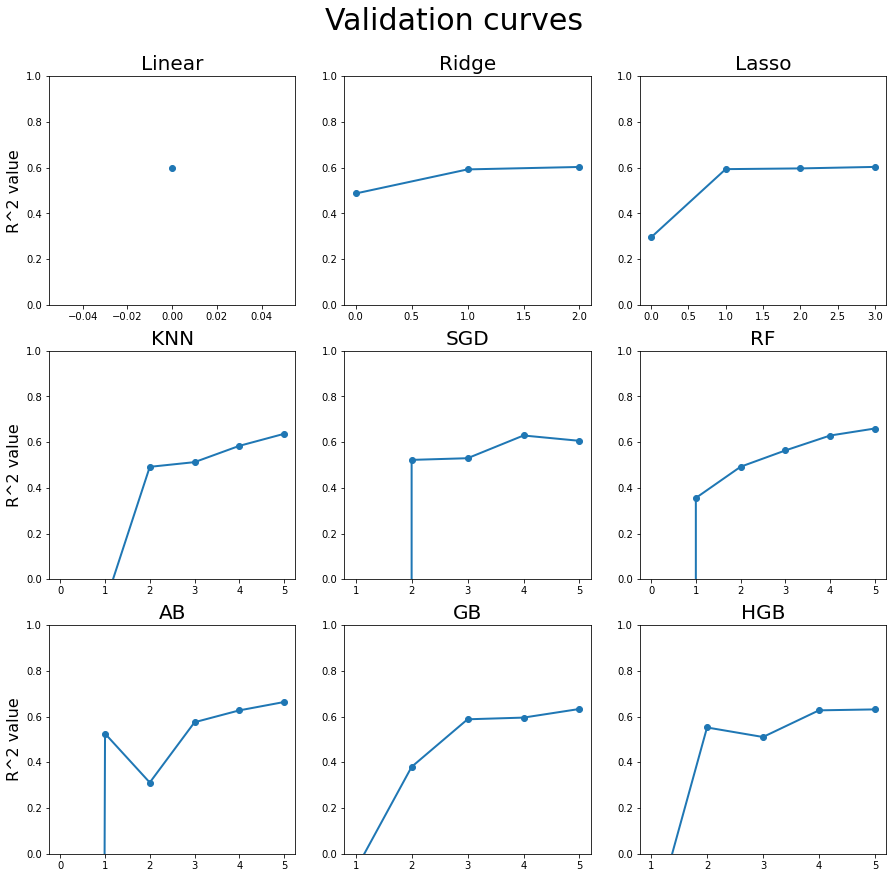

In [20]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(3, 3, figsize=(15, 12))
plt.setp(axs, ylim=(0,1))

for i, (name, result) in enumerate(cv_results.items()):
    row, col = i // 3, i % 3
    grouped_by_iter_df = result.groupby('iter').mean()
    iterations = grouped_by_iter_df.index
    test_scores = grouped_by_iter_df['mean_test_score']
    axs[row][col].set_title(name, fontsize=20)
    if col == 0:
        axs[row][col].set_ylabel('R^2 value', fontsize=16)
    axs[row][col].plot(iterations, test_scores, lw=2, marker='o')

fig.suptitle('Validation curves', fontsize=30)
fig.subplots_adjust(bottom=0, top=0.9)
plt.show()
fig.savefig('../figures/final_validation_curves.png', bbox_inches='tight')

### Evaluate Models on Test Set

In [21]:
test_results = {}

for name, result in results.items():
    y_pred = result.best_estimator_.predict(X_test)
    test_results[name] = {
        'mae': mean_absolute_error(y_test, y_pred),
        'mse': mean_squared_error(y_test, y_pred),
        'rmse': mean_squared_error(y_test, y_pred, squared=False),
        'r2': r2_score(y_test, y_pred)
    }

with open("../models/final/model_testing_final_results.json", "w") as outfile:
    json.dump(test_results, outfile)

test_results

{'Linear': {'mae': 3152547.308215952,
  'mse': 19577197504408.324,
  'rmse': 4424612.695412823,
  'r2': 0.6046788858685224},
 'Ridge': {'mae': 3207019.148762949,
  'mse': 20027048786802.902,
  'rmse': 4475159.079496829,
  'r2': 0.595595067303089},
 'Lasso': {'mae': 3206858.100210295,
  'mse': 20026687676918.297,
  'rmse': 4475118.733276056,
  'r2': 0.5956023591722073},
 'KNN': {'mae': 2801067.286777702,
  'mse': 16583554162929.652,
  'rmse': 4072291.0213944255,
  'r2': 0.6651293370017421},
 'SGD': {'mae': 3161292.6216536006,
  'mse': 19644488639075.082,
  'rmse': 4432210.355914426,
  'r2': 0.6033200802314211},
 'RF': {'mae': 2715599.577433629,
  'mse': 15747625450018.137,
  'rmse': 3968327.7901426107,
  'r2': 0.6820091927649717},
 'AB': {'mae': 2817020.8491357514,
  'mse': 15776310592817.385,
  'rmse': 3971940.4065037766,
  'r2': 0.6814299554860984},
 'GB': {'mae': 2760250.2198700113,
  'mse': 17442871281996.78,
  'rmse': 4176466.363086955,
  'r2': 0.6477772006285265},
 'HGB': {'mae': 

### Dimensionality reduction with PCA

The best model that we currently have is the AdaBoostRegressor. While that model is currently performing okay, we want to try reducing the number of dimensions to remove correlated variables and see if we get better performance.

In [24]:
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV

pipeline = Pipeline([
    ('scaling', preprocessor),
    ('pca', PCA()),
    ('model', AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10), learning_rate=0.3, loss='linear', n_estimators=600))
])
param_grid = {
    "pca__n_components": range(2, 33)
}

search = GridSearchCV(pipeline, param_grid, scoring='r2', n_jobs=-1, cv=10)
pca_results = search.fit(X_train, y_train)

/Users/achung/.pyenv/versions/3.10.0/lib/python3.10/site-packages/pandas/core/indexes/base.py:6982: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  return Index(sequences[0], name=names)


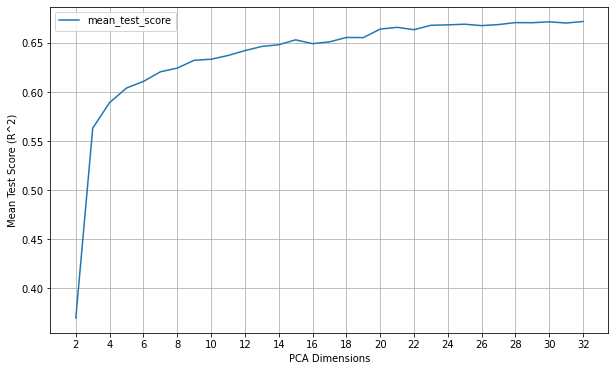

In [37]:
import matplotlib.pyplot as plt

pca_cv_results = pd.DataFrame(pca_results.cv_results_)
pca_cv_results.plot(x='param_pca__n_components', y='mean_test_score', figsize=(10, 6))
plt.xticks(range(2, 33, 2))
plt.xlabel('PCA Dimensions')
plt.ylabel('Mean Test Score (R^2)')
plt.grid()
plt.savefig('../figures/adaboost_pca_curve.png', bbox_inches='tight')

plt.show()

It seems that the usage of PCA does not have a noticeable effect on the test score, so I will proceed with simply the original dataset.

### Final Training

To train the final model, we do hyperparameter tuning on AdaBoostRegressor. Additionally, we tune the parameters of the base estimator (DecisionTreeRegressor) using the syntax for nested parameter tuning in GridSearchCV. We use GridSearchCV instead of HalvingGridSearchCV because we are only testing one model, and we want to get the best combination of parameters possible.

In [10]:
import sys
import os
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    os.environ["PYTHONWARNINGS"] = "ignore" # Also affect subprocesses

In [67]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'model__base_estimator__min_samples_split': [2, 5, 10],
    'model__base_estimator__max_features': ['sqrt', 'log2'],
    'model__learning_rate': [0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1, 1.5],
    'model__n_estimators': [400, 600, 800, 1000, 1250, 1500]
}

model = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())
pipeline = Pipeline([
    ('scaling', preprocessor),
    ('model', model)
])
search = GridSearchCV(pipeline, param_grid, scoring='r2', n_jobs=-1, cv=10)
final_result = search.fit(X_train, y_train)

In [71]:
print('Best Score: %s' % final_result.best_score_)
print('Best Hyperparameters: %s' % new_result.best_params_)

Best Score: 0.6793679170529651
Best Hyperparameters: {'model__base_estimator__max_features': 'log2', 'model__base_estimator__min_samples_split': 2, 'model__learning_rate': 1.5, 'model__n_estimators': 1000}


### Plotting Learning Curve and Feature Importance for Best Estimator

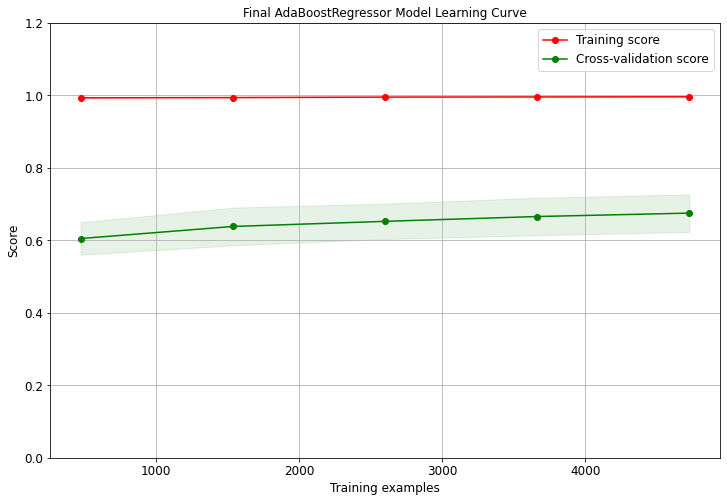

In [98]:
import scikitplot as skplt

skplt.estimators.plot_learning_curve(final_result.best_estimator_, X_train, y_train,
                                     cv=10, scoring="r2", n_jobs=-1, figsize=(12,8),
                                     title_fontsize="large", text_fontsize="large",
                                     title="Final AdaBoostRegressor Model Learning Curve")
plt.ylim((0, 1.2))
plt.savefig('../figures/final_model_learning_curve')
plt.show()

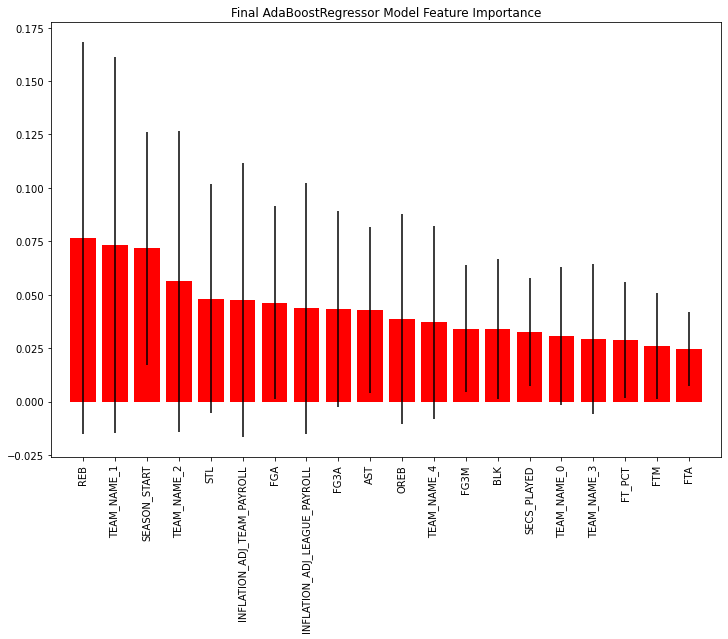

In [104]:
skplt.estimators.plot_feature_importances(final_result.best_estimator_['model'], feature_names=X_train.columns,
                                          title="Final AdaBoostRegressor Model Feature Importance",
                                         x_tick_rotation=90, figsize=(12,8))
plt.savefig('../figures/final_model_feature_importances', bbox_inches='tight')
plt.show()

### Evaluate model on test set

In [69]:
y_pred = new_result.best_estimator_.predict(X_test)
final_test_result = {
    'mae': mean_absolute_error(y_test, y_pred),
    'mse': mean_squared_error(y_test, y_pred),
    'rmse': mean_squared_error(y_test, y_pred, squared=False),
    'r2': r2_score(y_test, y_pred)
}

with open("../models/best_model_test_results.json", "w") as outfile:
    json.dump(final_test_result, outfile)

final_test_result

{'mae': 2573489.0517503805,
 'mse': 15123073939491.672,
 'rmse': 3888839.6649247026,
 'r2': 0.6946207220156841}

### Save best hyperparamaters and model for final model

In [105]:
best_final_params = {}

best_final_params = {
    "param_grid": final_result.param_grid,
    "best_params": final_result.best_params_,
    "best_score": final_result.best_score_,
    "scoring": final_result.scoring
}

with open("../models/best_model_best_params.json", "w") as outfile:
    json.dump(best_final_params, outfile)

In [106]:
import joblib

joblib.dump(final_result.best_estimator_, f'../models/final/adaboost.joblib')

['../models/final/adaboost.joblib']